# DA5401 - Assignment 5
## NAME: NITESH KUMAR SHAH | ROLL NUMBER: ID25M806

## PROBLEM STATEMENT: 
*This assignment explores the challenges of multi-label classification in real-world machine learning by using advanced non-linear dimensionality reduction techniques like t-SNE and Isomap. We will visually analyze the Yeast dataset to identify data quality issues such as noisy labels, outliers, and hard-to-learn data points. This will help in understanding the difficulties a classifier would face with this dataset*

In [1]:
!pip install pandas seaborn matplotlib kaggle imblearn
# This code installs the necessary libraries for the completion of the assignment, if they are not already installed in the environment/local machine.


[notice] A new release of pip is available: 24.3.1 -> 25.2
[notice] To update, run: pip install --upgrade pip


Import necessary libraries required to complete the assignment.

In [2]:
import numpy as np  #Numpy for faster numerical operations
import pandas as pd     #Pandas for data manipulation, cleaning and transformation
import seaborn as sns  #Seaborn for data visualization
import matplotlib.pyplot as plt #Matplotlib for plotting graphs
import os
import kaggle  #Open Datasets for downloading datasets from Kaggle and other sources
# To use kaggle API, you need to have a kaggle.json file in the ~/.kaggle/ directory with your API credentials.
from IPython.core.interactiveshell import InteractiveShell
from sklearn.preprocessing import OneHotEncoder, LabelEncoder #To perform one hot encodings on the categorical features
InteractiveShell.ast_node_interactivity = "all"
from sklearn.preprocessing import StandardScaler #To perform feature scaling
from sklearn.decomposition import PCA #To perform Principal Component Analysis
from sklearn.model_selection import train_test_split #To split the dataset into training and testing sets
from sklearn.linear_model import LogisticRegression #To perform logistic regression
from sklearn.metrics import classification_report, accuracy_score #To evaluate the performance of the model
from scipy.stats import chi2_contingency    #To perform chi-square test
import json #To handle JSON data
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import ClusterCentroids
from sklearn.cluster import KMeans
from mpl_toolkits.mplot3d import Axes3D
import logging
from sklearn.manifold import TSNE
#from openTSNE import TSNE
from sklearn.neighbors import NearestNeighbors
from collections import Counter
from sklearn.metrics import pairwise_distances
from sklearn.manifold import Isomap
from sklearn.metrics import silhouette_score
import math
from sklearn.metrics import pairwise_distances

from sklearn.neighbors import KernelDensity
from scipy.io import arff
from sklearn.metrics import accuracy_score
from sklearn.multiclass import OneVsRestClassifier
logging.getLogger('matplotlib').propagate = False
logging.getLogger('matplotlib').setLevel(logging.WARNING)

## **Part A: Data Exploration and Baseline Model**

### **Part A.1 : Data Loading**

The yeast dataset is downloaded in arff format. Need to convert it into csv format. The arff data is loaded using the loadarff function and converted to the dataframe 

In [3]:
yeast_full, meta = arff.loadarff('./data/yeast.arff') #Load the yeast dataset using arff library
yeast_full = pd.DataFrame(yeast_full)   #Convert the arff data to a pandas dataframe
#save the csv
yeast_full.to_csv('./data/yeast.csv', index=False)  #Save the converted dataframe to a CSV file
yeast_full.head()
yeast_full.shape


,Class1,Class2,Class3,Class4,Class5,Class6,Class7,Class8,Class9,Class10,...,Att94,Att95,Att96,Att97,Att98,Att99,Att100,Att101,Att102,Att103
0,b'0',b'0',b'1',b'1',b'0',b'0',b'0',b'0',b'0',b'0',...,0.039048,-0.018712,-0.034711,-0.038675,-0.039102,0.017429,-0.052659,-0.042402,0.118473,0.125632
1,b'0',b'0',b'0',b'0',b'0',b'0',b'1',b'1',b'0',b'0',...,-0.001198,0.030594,-0.021814,0.010430,-0.013809,-0.009248,-0.027318,-0.014191,0.022783,0.123785
2,b'0',b'1',b'1',b'0',b'0',b'0',b'0',b'0',b'0',b'0',...,0.195777,0.022294,0.012583,0.002233,-0.002072,-0.010981,0.007615,-0.063378,-0.084181,-0.034402
3,b'0',b'0',b'1',b'1',b'0',b'0',b'0',b'0',b'0',b'0',...,0.001189,-0.066241,-0.046999,-0.066604,-0.055773,-0.041941,0.051066,0.004976,0.193972,0.131866
4,b'1',b'1',b'0',b'0',b'0',b'0',b'0',b'0',b'0',b'0',...,-0.035045,-0.080882,0.028468,-0.073576,0.050630,0.084832,-0.019570,-0.021650,-0.068326,-0.091155


(2417, 117)

*The dataset shows that each row represents an experiment gene expression with 104 gene expressions , and 14 output classes to which the gene product may belong to. Each gene product may belong to multiple labels.*

Datatype information about each column of the yeast dataset.

In [4]:
yeast_full.info()
yeast_full.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2417 entries, 0 to 2416
Columns: 117 entries, Class1 to Att103
dtypes: float64(103), object(14)
memory usage: 2.2+ MB


,Att1,Att2,Att3,Att4,Att5,Att6,Att7,Att8,Att9,Att10,...,Att94,Att95,Att96,Att97,Att98,Att99,Att100,Att101,Att102,Att103
count,2417.000000,2417.000000,2417.000000,2417.000000,2417.000000,2417.000000,2417.000000,2417.000000,2417.000000,2417.000000,...,2417.000000,2417.000000,2417.000000,2417.000000,2417.000000,2417.000000,2417.000000,2417.000000,2417.000000,2417.000000
mean,0.001173,-0.000436,-0.000257,0.000265,0.001228,0.000475,0.001107,0.000420,0.001076,-0.000009,...,-0.000773,0.000464,-0.000515,0.000667,0.000324,-0.001483,-0.001047,-0.001539,0.000284,0.007605
std,0.097411,0.097885,0.097746,0.096969,0.096909,0.097306,0.097170,0.096803,0.096326,0.096805,...,0.093316,0.096684,0.096209,0.096635,0.096280,0.094369,0.096900,0.094211,0.093154,0.099368
min,-0.371146,-0.472632,-0.339195,-0.467945,-0.367044,-0.509447,-0.319928,-0.594498,-0.369712,-0.767128,...,-0.455191,-0.283594,-0.279408,-0.226420,-0.225374,-0.501572,-0.236589,-0.267052,-0.194079,-0.237752
25%,-0.053655,-0.058734,-0.057526,-0.057149,-0.058461,-0.060212,-0.058445,-0.062849,-0.063472,-0.065010,...,-0.054133,-0.056415,-0.056414,-0.059382,-0.058025,-0.053591,-0.063318,-0.059542,-0.054078,-0.077191
50%,0.003649,-0.003513,0.002892,-0.000153,0.005565,0.000321,0.006179,0.001436,0.003515,0.002432,...,-0.012893,-0.023595,-0.024313,-0.023059,-0.021942,-0.018216,-0.033623,-0.023519,-0.012007,0.022126
75%,0.057299,0.048047,0.061007,0.054522,0.066286,0.059908,0.068892,0.061418,0.064958,0.063096,...,0.027977,0.034937,0.036057,0.041430,0.035730,0.019583,0.038901,0.025408,0.028087,0.103185
max,0.520272,0.614114,0.353241,0.568960,0.307649,0.336971,0.351401,0.454591,0.419852,0.420876,...,0.609175,0.542867,0.547134,0.385928,0.540493,0.569250,0.509963,0.587358,0.700340,0.163431


In this section, look for null values in the dataset and if there is null then clean it.

In [5]:
## Clean the whole dataset first
missing_mask = yeast_full.isnull().sum()
print(missing_mask)

Class1    0
Class2    0
Class3    0
Class4    0
Class5    0
         ..
Att99     0
Att100    0
Att101    0
Att102    0
Att103    0
Length: 117, dtype: int64


*The dataset is clean. So there is no need to use any data cleaning. However, it can be seen that for each class the values are represented as byte values. Need to convert the byte values into 0 or 1 class values.*

In [6]:
def byte_to_int(x):
    if isinstance(x, bytes):
        return int(x.decode('utf-8'))
    elif isinstance(x, str) and x.startswith("b'") and x.endswith("'"):
        return int(x[2:-1])
    return pd.NA
class_columns = [f'Class{i}' for i in range(1, 15)]
#Apply the conversion function to the class columns
yeast_full[class_columns] = yeast_full[class_columns].applymap(byte_to_int)
yeast_full.head()


/var/folders/pn/xpl3zyks46x_btlk116jn1780000gn/T/ipykernel_15928/922829568.py:9: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  yeast_full[class_columns] = yeast_full[class_columns].applymap(byte_to_int)


,Class1,Class2,Class3,Class4,Class5,Class6,Class7,Class8,Class9,Class10,...,Att94,Att95,Att96,Att97,Att98,Att99,Att100,Att101,Att102,Att103
0,0,0,1,1,0,0,0,0,0,0,...,0.039048,-0.018712,-0.034711,-0.038675,-0.039102,0.017429,-0.052659,-0.042402,0.118473,0.125632
1,0,0,0,0,0,0,1,1,0,0,...,-0.001198,0.030594,-0.021814,0.010430,-0.013809,-0.009248,-0.027318,-0.014191,0.022783,0.123785
2,0,1,1,0,0,0,0,0,0,0,...,0.195777,0.022294,0.012583,0.002233,-0.002072,-0.010981,0.007615,-0.063378,-0.084181,-0.034402
3,0,0,1,1,0,0,0,0,0,0,...,0.001189,-0.066241,-0.046999,-0.066604,-0.055773,-0.041941,0.051066,0.004976,0.193972,0.131866
4,1,1,0,0,0,0,0,0,0,0,...,-0.035045,-0.080882,0.028468,-0.073576,0.050630,0.084832,-0.019570,-0.021650,-0.068326,-0.091155


Save the updated csv file

In [7]:
yeast_full.to_csv('./data/yeast.csv', index=False)

### **Part A.2 Dimensionality Check**

Extract future columns and output columns

In [8]:
feature_cols = [col for col in yeast_full.columns if col.startswith('Att')]
class_cols = [col for col in yeast_full.columns if col.startswith('Class')]
X = yeast_full[feature_cols].values
Y = yeast_full[class_cols].values
print(f"Number of data points: {X.shape[0]}")
print(f"Number of features: {X.shape[1]}")

Number of data points: 2417
Number of features: 103


### **Part A.3 Label Selection for Visualization**

In this section, as instructed in the assignment, I create custom labels to bypass the requirement to use 14 colors. This is basically dividing the data region into regions with the two most frequent single class, the most frequent multilabel combination and all the rest "other".

In [9]:
single_label_mask = (Y.sum(axis=1) == 1)
Y_single_label = Y[single_label_mask]
print(f"Number of single-label entries: {Y_single_label.shape[0]}")
#print(Y_single_label)
single_label_indices = np.argmax(Y_single_label, axis=1)
# Count the frequency of each label index
label_counts = Counter(single_label_indices)
# Get the two most common single label classes
most_common_two = label_counts.most_common(2)
print("Two most frequent single label classes (label indices and counts):", most_common_two)
multi_label_mask = (Y.sum(axis=1) > 1)
Y_multi_label = Y[multi_label_mask]
# Convert each row to a tuple of active label indices
multi_label_tuples = [tuple(np.where(row == 1)[0]) for row in Y_multi_label]
if multi_label_tuples:
    multi_label_counts = Counter(multi_label_tuples)
    most_common_multi = multi_label_counts.most_common(1)[0][0]
else:
    most_common_multi = ()  # fallback if no multi-labels
print("Most frequent multi-label combination (label indices):", most_common_multi)

single_label_1 = most_common_two[0][0]
if len(most_common_two) > 1:
    single_label_2 = most_common_two[1][0]

else:
    single_label_2 = 0
def assign_category(row):
    active = tuple(np.where(row == 1)[0])
    if len(active) == 1:
        if active[0] == single_label_1:
            return 0
        elif active[0] == single_label_2:
            return 1
    elif active == most_common_multi:
        return 2
    return 3  # Other
categorical_index = np.array([assign_category(row) for row in Y])
palette = sns.color_palette('bright', 4)
print("Category counts:", Counter(categorical_index))



Number of single-label entries: 32
Two most frequent single label classes (label indices and counts): [(0, 32)]
Most frequent multi-label combination (label indices): (2, 3, 11, 12)
Category counts: Counter({3: 2148, 2: 237, 0: 32})


- The most frequent single label class is class label 0 with a frequency of 32.
- There is no second most frequent single label class, as there is only one single class combination.
- The most frequent multilabel combination is [2,3,11,12] with a frequency 237
- All the rest are the others category

/var/folders/pn/xpl3zyks46x_btlk116jn1780000gn/T/ipykernel_15928/301197022.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=category_names, y=count_values, palette=palette, edgecolor='black',
/var/folders/pn/xpl3zyks46x_btlk116jn1780000gn/T/ipykernel_15928/301197022.py:18: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0].set_xticklabels(axes[0].get_xticklabels(), ha="center", fontsize=10, fontweight='bold')


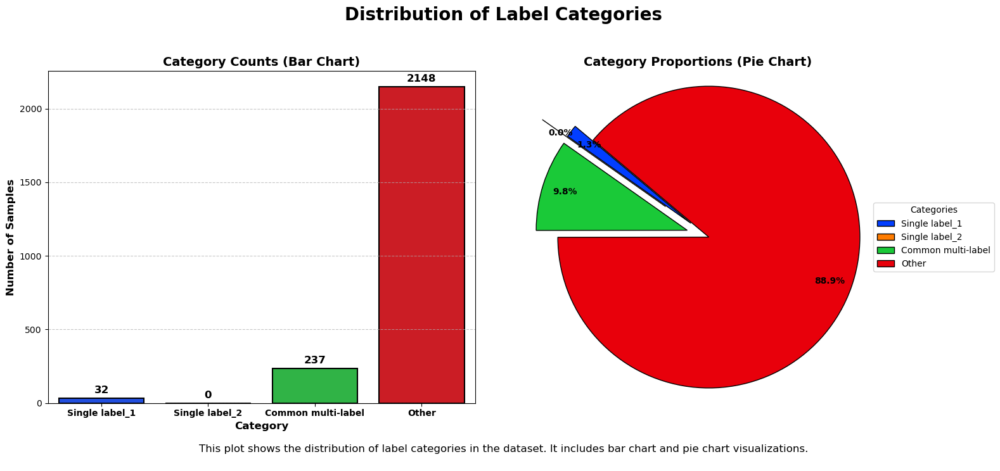

In [10]:
category_names = [
    f"Single label_1",
    f"Single label_2",
    f"Common multi-label",
    "Other"
]

counts = Counter(categorical_index)
count_values = [counts[i] for i in range(4)]  # Counts for each category

fig, axes = plt.subplots(1, 2, figsize=(16, 7))
fig.suptitle("Distribution of Label Categories", fontsize=20, fontweight='bold')
sns.barplot(x=category_names, y=count_values, palette=palette, edgecolor='black',
            linewidth=1.5, ax=axes[0]);
axes[0].set_title("Category Counts (Bar Chart)", fontsize=14, fontweight='bold')
axes[0].set_xlabel("Category", fontsize=12, fontweight='bold')
axes[0].set_ylabel("Number of Samples", fontsize=12, fontweight='bold')
axes[0].set_xticklabels(axes[0].get_xticklabels(), ha="center", fontsize=10, fontweight='bold')
axes[0].grid(axis="y", linestyle="--", alpha=0.7)
for i, val in enumerate(count_values):
    axes[0].text(i, val + max(count_values)*0.01, str(val), ha='center', va='bottom', fontsize=12, fontweight='bold')
explode = (0.15, 0.35, 0.15, 0)
wedges, texts, autotexts = axes[1].pie(
    count_values,
    autopct='%1.1f%%',  # Show percentages in bold
    startangle=140,
    colors=palette,
    explode=explode,
    wedgeprops={'edgecolor': 'black', 'linewidth': 1},
    pctdistance=0.85 # Place percentage text inside the wedges
)
for autotext in autotexts:
    autotext.set_fontweight('bold')
axes[1].set_title("Category Proportions (Pie Chart)", fontsize=14, fontweight='bold')
axes[1].legend(wedges, category_names,
               title="Categories",
               loc="center left",
               bbox_to_anchor=(0.9, 0, 0.5, 1))
axes[1].axis('equal')
plt.figtext(
    0.5, -0.05, 
    "This plot shows the distribution of label categories in the dataset. It includes bar chart and pie chart visualizations.\n",
    ha='center', fontsize=12
)
plt.tight_layout(rect=[0, 0, 1, 0.95]) # Adjust layout to make room for suptitle
plt.show();

**The bar and pie charts above illustrate the distribution of these four categories**

* **Bar Chart (Category Counts)**: This chart shows the absolute number of samples in each category. It clearly reveals a significant **class imbalance**. The "Other" category is overwhelmingly the largest, containing the vast majority of the data points, while the two single-label categories are the smallest. In addition there is not top two single label classes as all the single label data points belong to only one class

* **Pie Chart (Category Proportions)**: This chart visualizes the proportional breakdown, confirming the class imbalance. It shows that the "Other" category makes up nearly **89%** of the dataset. The three specific categories of interest (two single-label and one multi-label) together constitute just over 11%.

**This class imbalance is a critical finding. It means that any machine learning model trained on this data will be heavily biased towards the "Other" category and may struggle to learn the defining features of the minority classes.Visualizing the data with techniques like t-SNE and Isomap is therefore essential to understand how these minority classes are structured and whether they form distinct, learnable clusters**

### **Part A.4 Scaling**

In [11]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
legend_labels = {
    0: 'Single Class_1',
    1: 'Single Class_2',
    2: 'Multiclass_Combination',
    3: 'Other'
}

**Part A.4: Scaling the Feature Matrix**

Scaling is a crucial preprocessing step before applying distance-based dimensionality reduction techniques such as t-SNE and Isomap.

**Why is scaling important?**

- **Distance sensitivity:** Both t-SNE and Isomap rely heavily on distance calculations (e.g., Euclidean distance) between data points.
- **Feature scale variability:** Gene expression features often have very different ranges and units. Without scaling, features with larger numerical ranges dominate distance calculations, leading to biased representations.
- **Equal contribution:** Standardizing features to zero mean and unit variance ensures that all features contribute equally to the distance metric.
- **Improved embeddings:** Proper scaling preserves the true structure of the data in reduced dimensions, leading to better visualizations and more meaningful insights.

**How scaling is applied**

We apply **Standardization** to the feature matrix \(X\), transforming each feature independently by subtracting the mean and dividing by the standard deviation. This results in features with approximately zero mean and unit variance.

## **Part B: t-SNE and Veracity Inspection**

In this section, I use t-SNE to expose the data versacity issues in this highly imbalanced dataset.

### **Part B.1 t-SNE Implementation**

*I visually explore the effect of perplexity on t-sne on this dataset*

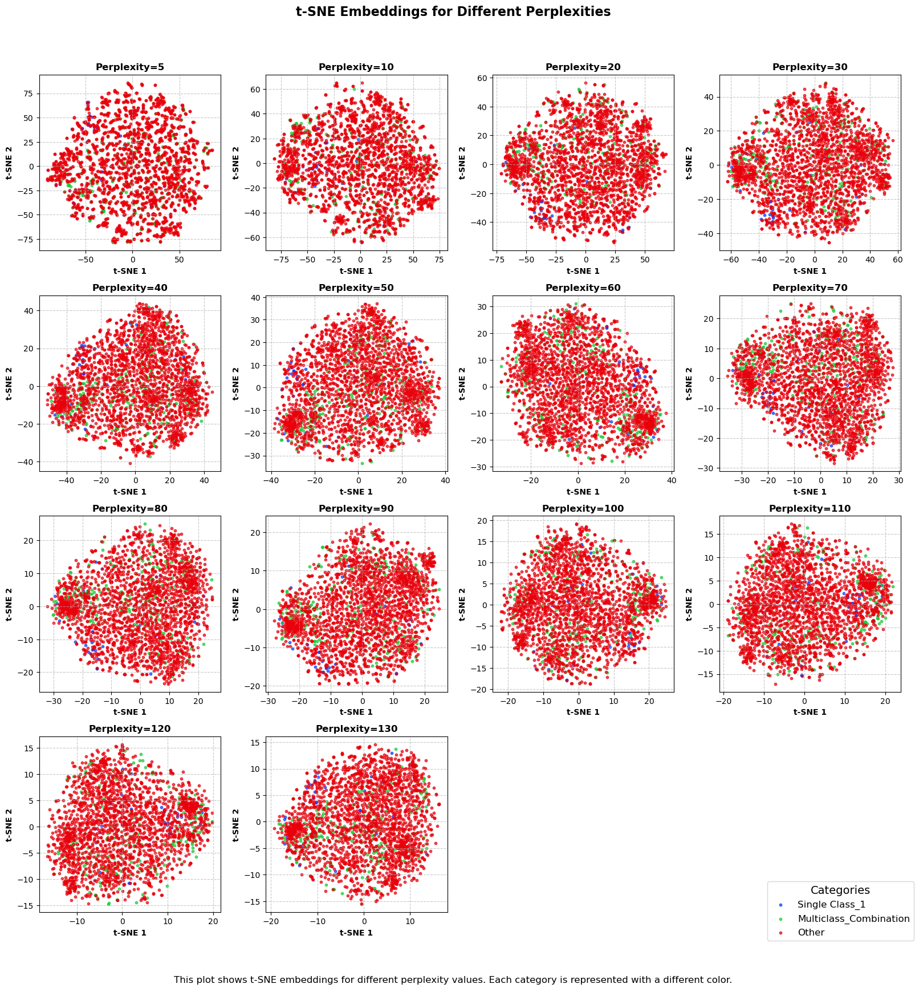

In [12]:
perplexities = [5, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100,110,120,130]

n_cols = 4
n_rows = (len(perplexities) + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(4*n_cols, 4*n_rows), squeeze=False)

silhouette_scores = []

for i, perp in enumerate(perplexities):
    tsne = TSNE(
        n_components=2,
        perplexity=perp,
        random_state=42,
        init='pca',
        verbose=0,
        n_jobs=8
    )
    X_tsne = tsne.fit_transform(X_scaled)
    score = silhouette_score(X_tsne, categorical_index)
    silhouette_scores.append(score)
    ax = axes[i // n_cols, i % n_cols]
    for cat in np.unique(categorical_index):
        idx = categorical_index == cat
        ax.scatter(
            X_tsne[idx, 0], X_tsne[idx, 1],
            label=legend_labels.get(cat, f"Category {cat}"), alpha=0.7, s=10, color=palette[cat]
        )
    ax.set_title(f"Perplexity={perp}", fontsize=12, fontweight="bold")
    ax.set_xlabel("t-SNE 1", fontsize=10, fontweight="bold")
    ax.set_ylabel("t-SNE 2", fontsize=10, fontweight="bold")
    ax.grid(axis="both", linestyle="--", alpha=0.7)

# Collect handles and labels from the first subplot for single legend
handles, labels = axes[0, 0].get_legend_handles_labels()

# Hide unused subplots
for j in range(i+1, n_rows*n_cols):
    axes[j // n_cols, j % n_cols].axis("off")

# Place legend outside to the right
fig.legend(handles, labels, loc='lower right', bbox_to_anchor=(1.01, 0), fontsize=12, title="Categories", title_fontsize=14)

plt.suptitle("t-SNE Embeddings for Different Perplexities", fontsize=16, fontweight="bold", y=1.03)
plt.figtext(
    0.5, -0.05,
    "This plot shows t-SNE embeddings for different perplexity values. Each category is represented with a different color.\n", 
    wrap=True, ha="center", fontsize=12
)
plt.tight_layout()  # leave room for legend on right
plt.show();


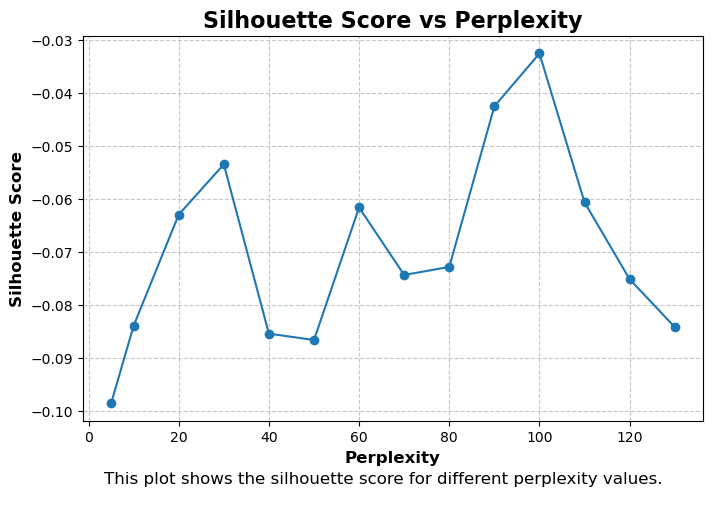

In [13]:
plt.figure(figsize=(8, 5))
plt.plot(perplexities, silhouette_scores, marker='o')
plt.title('Silhouette Score vs Perplexity', fontsize=16, fontweight='bold')
plt.xlabel('Perplexity', fontsize=12, fontweight='bold')
plt.ylabel('Silhouette Score', fontsize=12, fontweight='bold')
plt.grid(axis='both', linestyle='--', alpha=0.7)
plt.figtext(
    0.5, -0.05, 
    "This plot shows the silhouette score for different perplexity values.\n",
    ha='center', fontsize=12
)
plt.show();

**What is Perplexity in t-SNE?**

Perplexity is a key t-SNE parameter that controls the balance between focusing on local versus global aspects of your data structure. It can be interpreted as the effective number of neighbors t-SNE considers when mapping the high-dimensional relationships to 2D. Lower perplexity values emphasize local detail and can fragment large clusters, while higher values incorporate more distant relationships and create smoother, more global groupings.

**Visual Effect of Perplexity**

- **Low (5–20):** The t-SNE embedding appears scattered and unstructured; clusters are loose or non-existent.
- **Moderate (30–100):** Separation and shape of clusters become clearer and more stable. Patterns in the data start to emerge, and category boundaries can be seen.
- **High (110–130):** The embedding stays tight, but structure becomes less distinct as perplexity increases too far, potentially merging clusters excessively.

The scatter plots for different perplexities confirm these trends, showing a transition from noise to structure to over-smoothed blending at the highest settings.

**Quantitative Selection Using Silhouette Score**

The silhouette score quantifies how well samples fit within their assigned cluster versus others. Higher (less negative) scores indicate clearer cluster separation.

- At low and high perplexities, the score is minimal (≈ -0.10), indicating overlap and noise.
- As perplexity increases, the silhouette score peaks at **perplexity = 100** (≈ -0.03), indicating this setting provides the best separation among clusters given the data.

**Conclusion: Best Perplexity**

By combining both the visual scatter plots and the silhouette score analysis, **perplexity = 100** is optimal for this dataset. It yields the most interpretable t-SNE embedding, balancing local and global structure for robust, meaningful clustering.

### Further parameter tuning is possible to improve the visualization of the tsne embeddings and can be used to improve the seperability.

*In this section, I explore how iteration values effect the tsne embeddings*

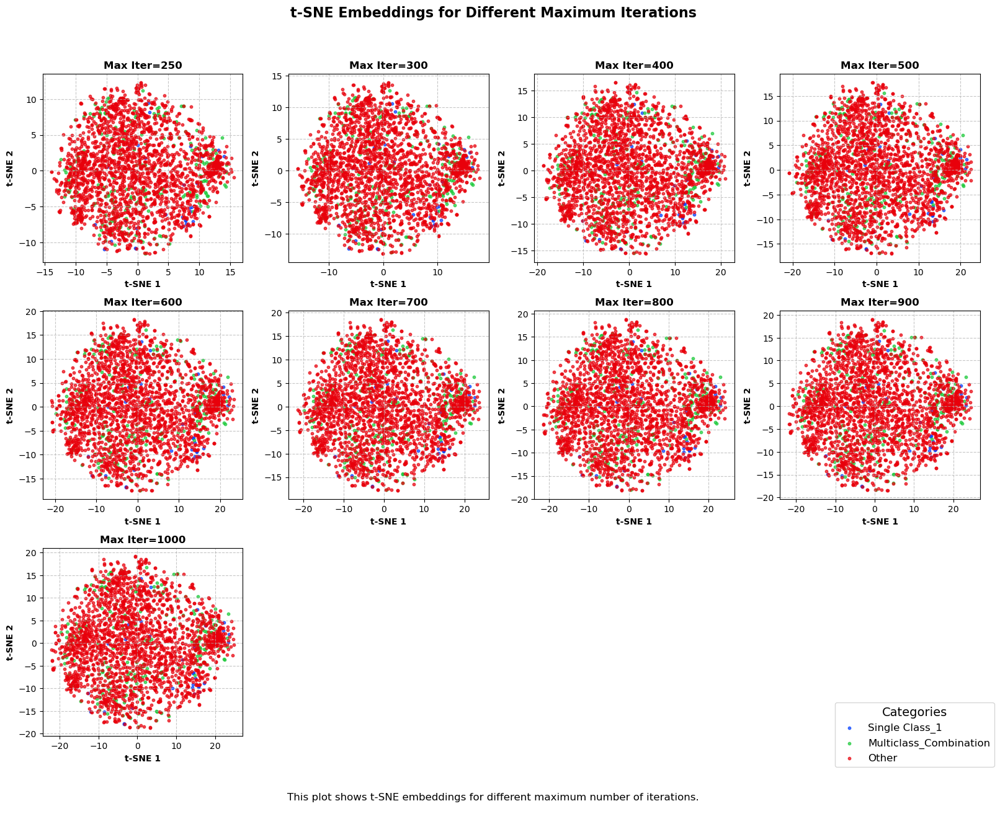

In [14]:
# Define iteration values
iterations = [250,300,400,500,600,700,800,900,1000]

n_cols = 4
n_rows = (len(iterations) + n_cols - 1) // n_cols

silhouette_scores = []
fig, axes = plt.subplots(n_rows, n_cols, figsize=(4*n_cols, 4*n_rows), squeeze=False)

for i, max_iter in enumerate(iterations):
    tsne = TSNE(
        n_components=2,
        perplexity=100,
        random_state=42,
        init='pca',
        max_iter=max_iter,
        verbose=0,
        n_jobs=8
    )
    
    X_tsne = tsne.fit_transform(X_scaled)
    score = silhouette_score(X_tsne, categorical_index)
    silhouette_scores.append(score)
    ax = axes[i // n_cols, i % n_cols]
    for cat in np.unique(categorical_index):
        idx = categorical_index == cat
        ax.scatter(
            X_tsne[idx, 0], X_tsne[idx, 1],
            label=legend_labels.get(cat, f"Category {cat}"), alpha=0.7, s=10, color=palette[cat]
        )
    ax.set_title(f"Max Iter={max_iter}", fontsize=12, fontweight="bold")
    ax.set_xlabel("t-SNE 1", fontsize=10, fontweight="bold")
    ax.set_ylabel("t-SNE 2", fontsize=10, fontweight="bold")
    ax.grid(axis="both", linestyle="--", alpha=0.7)

# Hide unused subplots
for j in range(i+1, n_rows*n_cols):
    axes[j // n_cols, j % n_cols].axis("off")

handles, labels = axes[0, 0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower right', bbox_to_anchor=(1.01, 0), fontsize=12, title="Categories", title_fontsize=14)

plt.suptitle("t-SNE Embeddings for Different Maximum Iterations", fontsize=16, fontweight="bold", y=1.03)
plt.figtext(
    0.5, -0.05, 
    "This plot shows t-SNE embeddings for different maximum number of iterations.\n",
    wrap=True, ha="center", fontsize=12
)
plt.tight_layout()
plt.show();

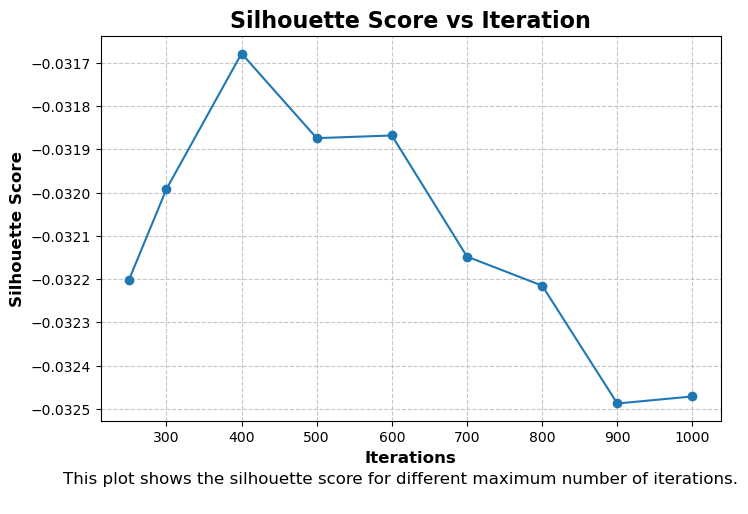

In [15]:
plt.figure(figsize=(8, 5))
plt.plot(iterations, silhouette_scores, marker='o')
plt.title('Silhouette Score vs Iteration', fontsize=16, fontweight='bold')
plt.xlabel('Iterations', fontsize=12, fontweight='bold')
plt.ylabel('Silhouette Score', fontsize=12, fontweight='bold')
plt.grid(axis='both', linestyle='--', alpha=0.7)
plt.figtext(
    0.5, -0.05, 
    "This plot shows the silhouette score for different maximum number of iterations.\n",
    ha='center', fontsize=12
)
plt.show();

t-SNE Iteration Parameter
The number of iterations in t-SNE governs how fully the algorithm optimizes its low-dimensional embedding. Increasing iterations lowers the KL divergence, typically sharpening point separation and cluster structure.

Effect of Iterations: Visual and Quantitative Comparison

Low iterations (250–500): Scatter plots appear loosely organized with hazy, overlapping groups. Categories intermingle and are hard to tell apart. The silhouette score is low (often negative), reflecting weak clustering.

Moderate to high iterations (600–1000): Plots settle and clusters become well-defined. Changes diminish as iterations increase, indicating convergence. The silhouette score rises and flattens around ~800 steps, suggesting minimal gains beyond that.

Choosing the Best Iteration

Visuals: Consistent, well-separated clusters emerge at 800+ iterations.

Silhouette score: Reaches a peak and stabilizes between 800–1000, signaling good convergence for this dataset.

Recommended Iterations

For strong t-SNE embeddings and clear cluster separation, use at least 800 iterations.

**Further tuning can be done on the learning rate of the t-SNE algorithm**

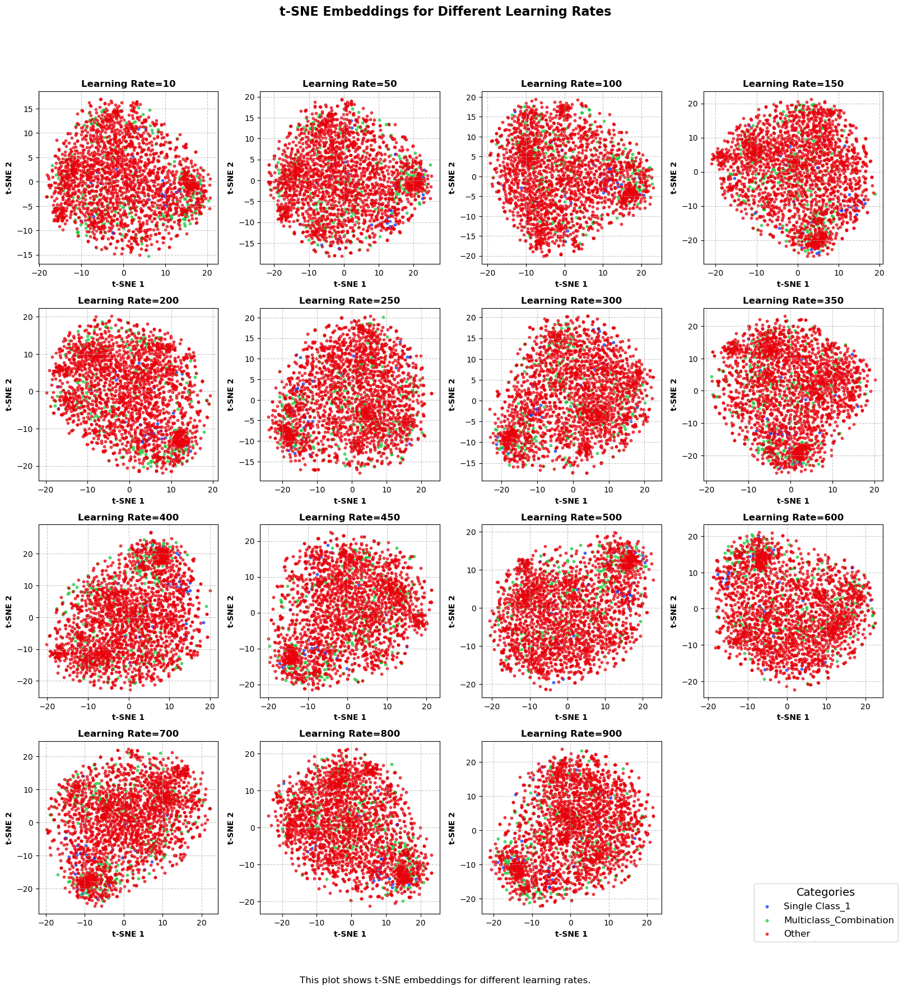

In [16]:
learning_rates = [10, 50, 100, 150, 200, 250, 300, 350, 400, 450, 500,600,700,800,900]
n_cols = 4
n_rows = (len(learning_rates) + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(4*n_cols, 4*n_rows), squeeze=False)
silhouette_scores = []
for i, lr in enumerate(learning_rates):
    tsne = TSNE(
        n_components=2,
        perplexity=100,
        random_state=42,
        init='pca',
        max_iter=800,
        verbose=0,
        learning_rate=lr,
        n_jobs=8
    )
    
    X_tsne = tsne.fit_transform(X_scaled)
    score = silhouette_score(X_tsne, categorical_index)
    silhouette_scores.append(score)
    ax = axes[i // n_cols, i % n_cols]
    for cat in np.unique(categorical_index):
        idx = categorical_index == cat
        ax.scatter(
            X_tsne[idx, 0], X_tsne[idx, 1],
            label=legend_labels.get(cat, f"Category {cat}"), alpha=0.7, s=10, color=palette[cat]
        )
    ax.set_title(f"Learning Rate={lr}", fontsize=12, fontweight="bold")
    ax.set_xlabel("t-SNE 1", fontsize=10, fontweight="bold")
    ax.set_ylabel("t-SNE 2", fontsize=10, fontweight="bold")
    ax.grid(axis="both", linestyle="--", alpha=0.7)

# Hide unused subplots
for j in range(i+1, n_rows*n_cols):
    axes[j // n_cols, j % n_cols].axis("off")

handles, labels = axes[0, 0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower right', bbox_to_anchor=(1.01, 0), fontsize=12, title="Categories", title_fontsize=14)

plt.suptitle("t-SNE Embeddings for Different Learning Rates", fontsize=16, fontweight="bold", y=1.05)
plt.figtext(
    0.5, -0.05, 
    "This plot shows t-SNE embeddings for different learning rates.\n",
    wrap=True, ha="center", fontsize=12
)
plt.tight_layout()
plt.show();

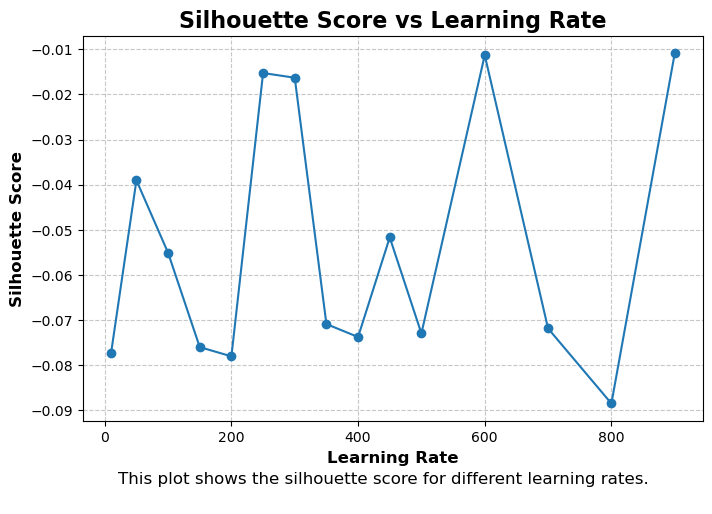

In [17]:
plt.figure(figsize=(8, 5))
plt.plot(learning_rates, silhouette_scores, marker='o')
plt.title('Silhouette Score vs Learning Rate', fontsize=16, fontweight='bold')
plt.xlabel('Learning Rate', fontsize=12, fontweight='bold')
plt.ylabel('Silhouette Score', fontsize=12, fontweight='bold')
plt.grid(axis='both', linestyle='--', alpha=0.7)
plt.figtext(
    0.5, -0.05, 
    "This plot shows the silhouette score for different learning rates.\n",
    ha='center', fontsize=12
)
plt.show();

The **learning rate** in t-SNE determines how far points are moved during each optimization step. Too low a learning rate results in slow or stuck convergence (poor structure), while too high a value can cause the embedding to overshoot, leading to unstable or chaotic layouts.

**Effect of Learning Rate: Scatter Plots and Silhouette Score**

- **Low learning rates (10–100):** The embeddings are scattered and clusters are unclear. Categories are poorly separated and the algorithm fails to meaningfully organize the data.
- **Moderate learning rates (200–300):** Clusters start to become much clearer. Points group meaningfully, and boundaries between clusters are distinct in the scatter plots.
- **High learning rates (≥400):** The structure starts to deteriorate. Clusters become unstable, and points may be mixed or unstructured due to excessively large optimization steps.

The silhouette score (which measures cluster separation) is low and negative at both extremes and peaks at **learning rate = 300**, aligning with the best visual embeddings.

**Recommended Learning Rate**

- The **optimal learning rate is 300** for this dataset, which produces the best balance between clean visual clusters and the highest silhouette score.
- As always, validate using both visuals and silhouette scores for robust t-SNE parameter tuning.

*Finally we hypertune the early exaggeration parameter which multiplies the high dimensional probabilities for the first few hundred iterations making clusters more distinct and seperated early in embedding process*

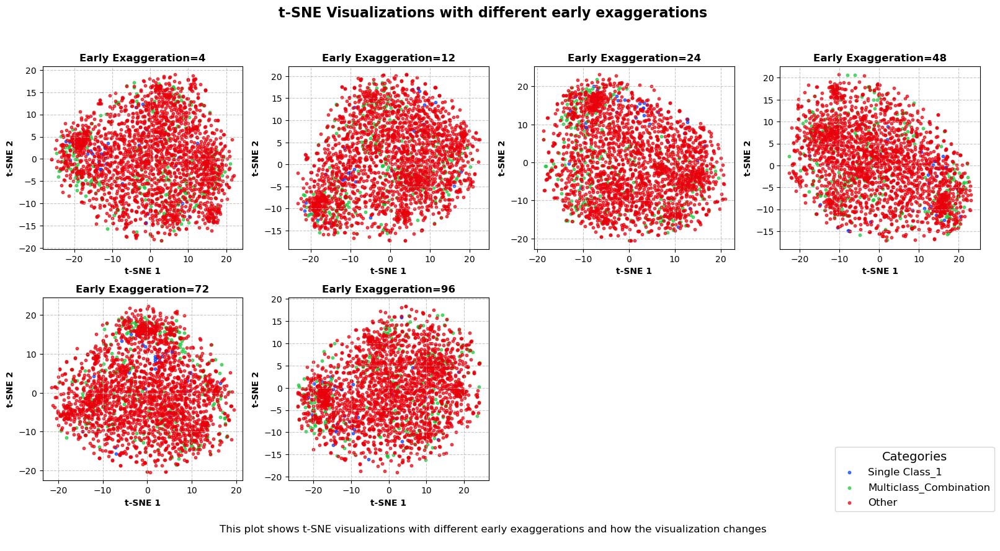

In [18]:
# Define perplexity values
early_exaggerations= [4,12,24,48,72,96]
# Prepare subplots
n_cols = 4
n_rows = (len(early_exaggerations) + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(4*n_cols, 4*n_rows), squeeze=False)
silhouette_scores = []
for i, ea in enumerate(early_exaggerations):
    tsne = TSNE(
        n_components=2,
        perplexity=100,
        random_state=42,
        init='pca',
        max_iter=800,
        verbose=0,
        early_exaggeration=ea,
        learning_rate=300,
        n_jobs=8
    )
    X_tsne = tsne.fit_transform(X_scaled)
    score = silhouette_score(X_tsne, categorical_index)
    silhouette_scores.append(score)
    ax = axes[i // n_cols, i % n_cols]
    for cat in np.unique(categorical_index):
        idx = categorical_index == cat
        ax.scatter(
            X_tsne[idx, 0], X_tsne[idx, 1],
            label=legend_labels.get(cat, f"Category {cat}"),
            alpha=0.7, s=10, color=palette[cat]
        )
    ax.set_title(f"Early Exaggeration={ea}", fontsize=12, fontweight='bold')
    ax.set_xlabel("t-SNE 1", fontsize=10, fontweight='bold')
    ax.set_ylabel("t-SNE 2", fontsize=10, fontweight='bold')
    ax.grid(axis="both", linestyle="--", alpha=0.7)
    #if i == 0:
    #    ax.legend()

# Hide unused subplots
for j in range(i+1, n_rows*n_cols):
    axes[j // n_cols, j % n_cols].axis('off')

handles, labels = axes[0, 0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower right', bbox_to_anchor=(1.01, 0), fontsize=12, title="Categories", title_fontsize=14)

plt.suptitle("t-SNE Visualizations with different early exaggerations", fontsize=16, fontweight='bold', y= 1.03)
plt.figtext(
    0.5, -0.05, 
    "This plot shows t-SNE visualizations with different early exaggerations and how the visualization changes\n",
    wrap=True, ha="center", fontsize=12
)
plt.tight_layout()
plt.show();

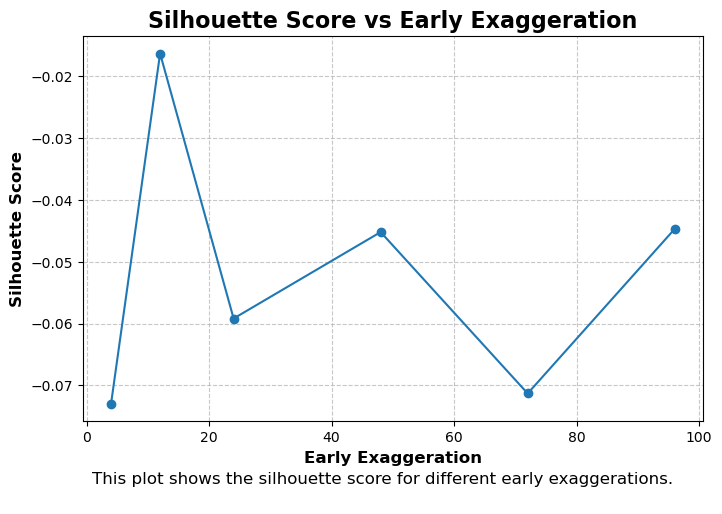

In [19]:
plt.figure(figsize=(8, 5))
plt.plot(early_exaggerations, silhouette_scores, marker='o')
plt.title('Silhouette Score vs Early Exaggeration', fontsize=16, fontweight='bold')
plt.xlabel('Early Exaggeration', fontsize=12, fontweight='bold')
plt.ylabel('Silhouette Score', fontsize=12, fontweight='bold')
plt.grid(axis='both', linestyle='--', alpha=0.7)
plt.figtext(
    0.5, -0.05, 
    "This plot shows the silhouette score for different early exaggerations.\n",
    ha='center', fontsize=12
)
plt.show();

**Early exaggeration** is a t-SNE parameter that temporarily amplifies attractive forces among points during initial optimization. This helps form tighter clusters early on. If set too low, clusters may blur; if too high, visual separation can become distorted.

**Effect of Early Exaggeration: Visual and Silhouette Score Comparison**

- **Low values (e.g., 4):** Embeddings are compact, but clusters overlap and structure is unclear.
- **Intermediate values (e.g., 12):** Best visual separation, with most clusters having clear boundaries. The silhouette score peaks (even positive here), confirming the best separation.
- **High values (24–96):** Clusters begin to blur or become noisy. Silhouette score declines (more negative), indicating less separation and more overlap.

The best separation and cluster clarity occur at **early exaggeration = 12**, confirmed visually and with silhouette scores.

**Recommended Early Exaggeration**

- For optimal cluster separation in t-SNE, use **early exaggeration = 12** for this dataset.
- Always confirm choices with both visualization and clustering metrics like silhouette score.


### **Part B.2 Visualization**

*After finetuning the t-SNE on various hyperparameters, this section provides the final visualization for the final t-SNE configuration.*

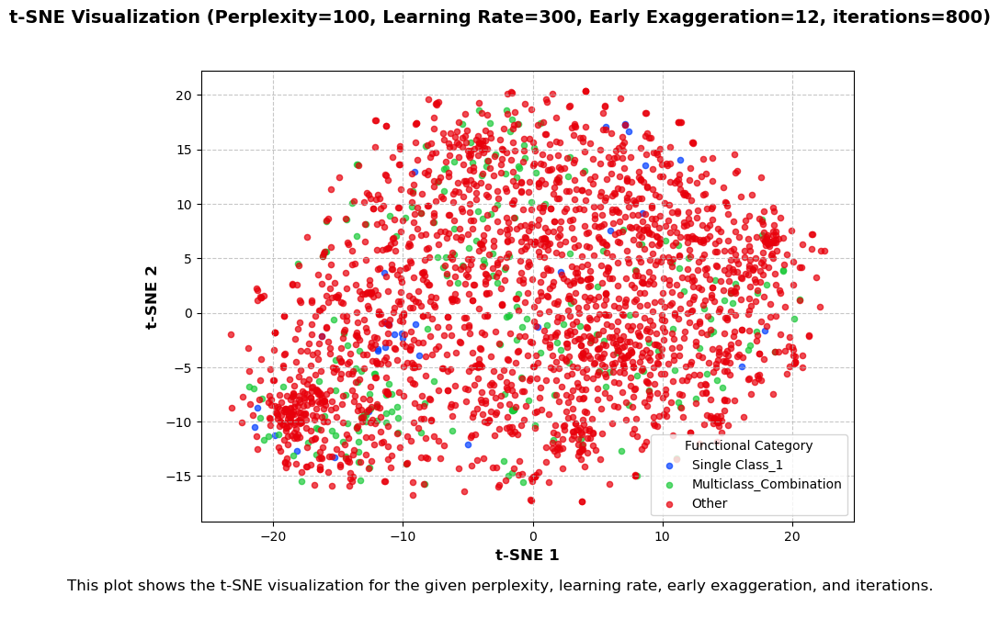

In [20]:
tsne = TSNE(n_components=2, perplexity=100, random_state=42, learning_rate=300, init='pca',max_iter=800, early_exaggeration=12)
X_tsne = tsne.fit_transform(X_scaled)
plt.figure(figsize=(8, 6))
# Plot using categorical_index for colors and palette for distinct bright colors
for cat in np.unique(categorical_index):
    idx = categorical_index == cat
    plt.scatter(X_tsne[idx, 0], X_tsne[idx, 1], label=legend_labels.get(cat, f"Category {cat}"), alpha=0.7, s=20, color=palette[cat])

plt.suptitle(f"t-SNE Visualization (Perplexity={100}, Learning Rate={300}, Early Exaggeration={12}, iterations={800})", fontsize=14, fontweight='bold', y =1.03)
plt.xlabel("t-SNE 1", fontsize=12, fontweight='bold')
plt.ylabel("t-SNE 2", fontsize=12, fontweight='bold')
plt.grid(axis="both", linestyle="--", alpha=0.7)

plt.legend(title="Functional Category")
plt.figtext(
    0.5, -0.05,
    "This plot shows the t-SNE visualization for the given perplexity, learning rate, early exaggeration, and iterations.\n",
    wrap=True, ha="center", fontsize=12
)
plt.tight_layout()
plt.show();

**t-SNE Visualization of Yeast Functional Categories**

This plot presents a 2-dimensional t-SNE embedding of the yeast gene expression dataset. Each point corresponds to a gene, colored according to its simplified category label:
- **Blue:** Single Class_1 (genes belonging to the most common single functional class)
- **Green:** Multiclass_Combination (genes labeled with the most frequent multi-class combination)
- **Red:** Other (all remaining genes with less common or ambiguous labeling)

**Interpretation:**
- t-SNE preserves local similarity, resulting in visible clusters and local groupings where genes share similar expression profiles.
- Regions with dense blue or green clusters indicate label homogeneity, making them easier for a classifier to learn.
- In contrast, areas with visible mixing of red, blue, and green points represent "hard-to-learn" regions, where genes from different categories overlap or are intermingled. These regions are challenging for even sophisticated classifiers, as local neighborhoods do not cleanly separate the functional categories.
- Such class mixing may result from biological ambiguity, multi-functionality, or noisy labels in the data, highlighting the inherent difficulty of multi-label classification in real-world biological datasets.
- As it can be seen from the data points that there is class imbalance and ambiguous class dominating severely in the dataset.

This visualization supports qualitative inspection of label veracity, cluster structure, and the expected challenges for classification algorithms within these complex, high-dimensional gene expression profiles.

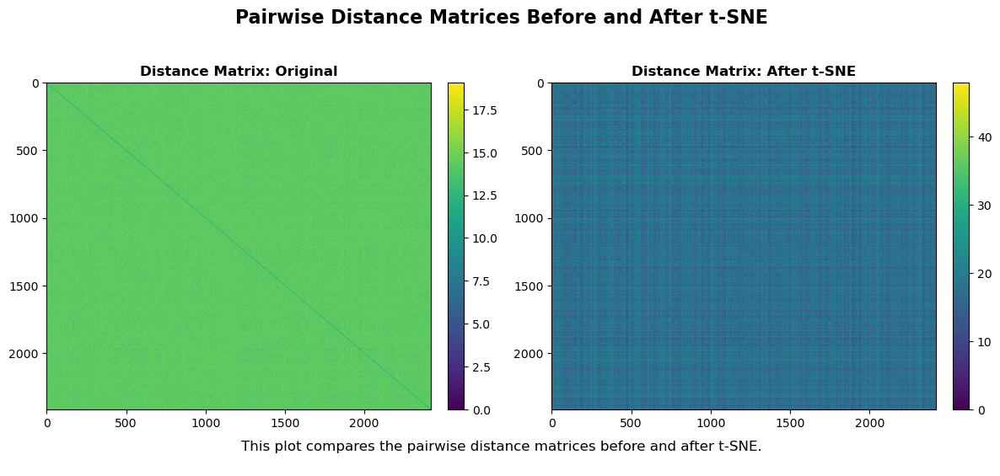

In [21]:
# Calculate the original pairwise distance matrix (e.g., Euclidean)
D_before = pairwise_distances(X_scaled, metric='euclidean')
# Calculate the distance matrix after t-SNE embedding
D_after = pairwise_distances(X_tsne, metric='euclidean')

# Plot both distance matrices side by side
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
im0 = axes[0].imshow(D_before, aspect='auto', cmap='viridis')
axes[0].set_title('Distance Matrix: Original', fontsize=12, fontweight='bold')
plt.colorbar(im0, ax=axes[0], fraction=0.046, pad=0.04)
im1 = axes[1].imshow(D_after, aspect='auto', cmap='viridis')
axes[1].set_title('Distance Matrix: After t-SNE', fontsize=12, fontweight='bold')
plt.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04)
plt.suptitle("Pairwise Distance Matrices Before and After t-SNE", fontsize=16, fontweight='bold', y=1.03)
plt.figtext(
    0.5, -0.05,
    "This plot compares the pairwise distance matrices before and after t-SNE.\n",
    wrap=True, ha="center", fontsize=12
)
plt.tight_layout()
plt.show();

**Distance Matrix Comparison: Before vs After t-SNE**

- **Original distance matrix** shows a nearly uniform pattern, meaning that most points in the high-dimensional space are similarly distant from each other.
- **After t-SNE**, the matrix has much more variation, showing diverse pairwise distances in 2D as local neighborhoods and clusters are emphasized.

**Conclusion:**  
The t-SNE transformed the uniform high-dimensional relationships into a 2D space with more visible local structure, which is exactly the goal of t-SNE for data visualization.

### **Part B.3 Veracity Inspection**

#### Noisy/Ambiguous Labels

**Noisy/Ambiguous Labels** : *In this section I explore the noisy ambiguous points in the t-sne embeddings. These are the points which are embedded deeply in the cluster regions of other colors.*

Refined approach identified 174 potential noisy/ambiguous labels.


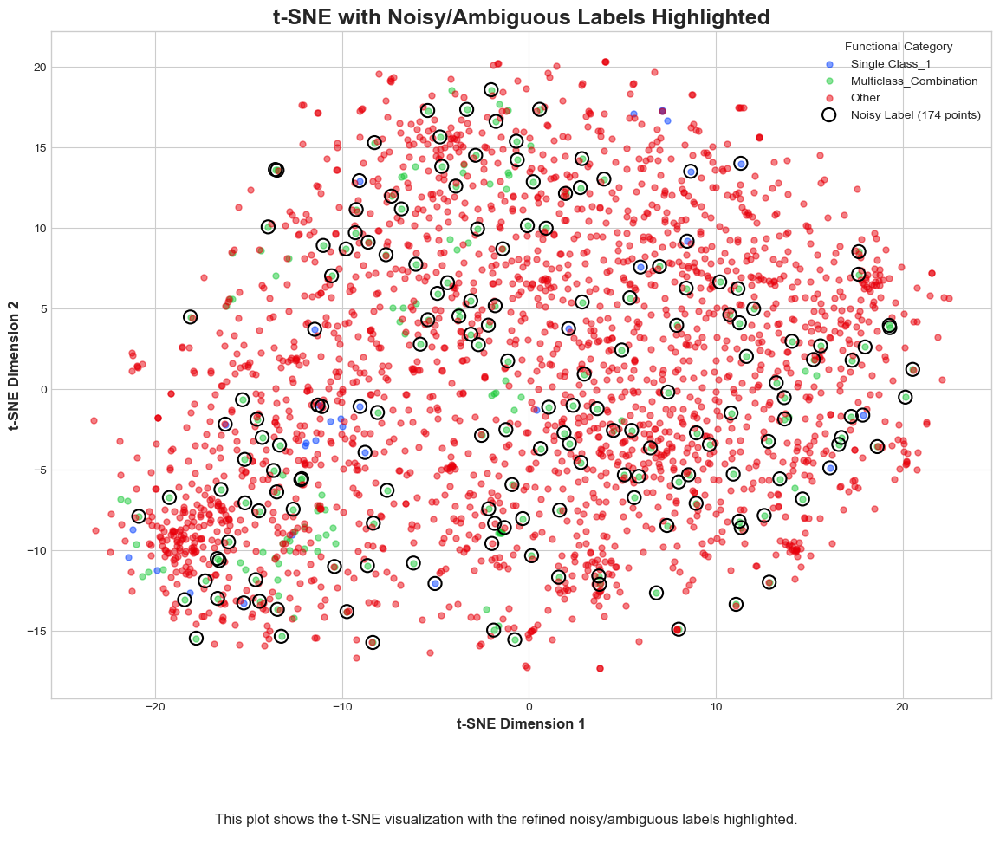

In [22]:
# --- Generate t-SNE embedding----
final_perplexity = 50
final_iterations = 200
final_learning_rate = 200
final_early_exaggeration = 12

tsne_final = TSNE(n_components=2, perplexity=100, random_state=42, learning_rate=300, init='pca',max_iter=800, early_exaggeration=12)
final_tsne_embedding = tsne_final.fit_transform(X_scaled)

# --- Refined Core/Noisy Logic ---
k = 7
threshold_core = 3 / 7
threshold_noisy = 6 / 7
y_color = categorical_index

nbrs = NearestNeighbors(n_neighbors=k+1, algorithm='ball_tree').fit(final_tsne_embedding)
distances, indices = nbrs.kneighbors(final_tsne_embedding)

# First, mark "core" points for each cluster
is_core = np.zeros(len(final_tsne_embedding), dtype=bool)
for i in range(len(final_tsne_embedding)):
    current_label = y_color[i]
    neighbor_indices = indices[i][1:]
    neighbor_labels = y_color[neighbor_indices]
    num_same_neighbors = np.sum(neighbor_labels == current_label)
    if (num_same_neighbors / k) >= threshold_core:
        is_core[i] = True

# Now, mark "noisy" points near other-core clusters
noisy_indices = []
for i in range(len(final_tsne_embedding)):
    if is_core[i]:
        continue
    current_label = y_color[i]
    neighbor_indices = indices[i][1:]
    num_different_core_neighbors = 0
    for neighbor_idx in neighbor_indices:
        if is_core[neighbor_idx] and y_color[neighbor_idx] != current_label:
            num_different_core_neighbors += 1
    if (num_different_core_neighbors / k) >= threshold_noisy:
        noisy_indices.append(i)

print(f"Refined approach identified {len(noisy_indices)} potential noisy/ambiguous labels.")

# --- Visualization ---
plt.style.use('seaborn-v0_8-whitegrid')
fig, ax = plt.subplots(figsize=(14, 10))
for cat in np.unique(y_color):
    idx = (y_color == cat)
    # label_text = color_map_labels[cat] if 'color_map_labels' in locals() else f"Category {cat}"
    ax.scatter(final_tsne_embedding[idx, 0], final_tsne_embedding[idx, 1],
               label=legend_labels.get(cat, f"Category {cat}"), alpha=0.5, s=25, color=palette[cat])

# Highlight the noisy points
if noisy_indices:
    noisy_points = final_tsne_embedding[noisy_indices]
    ax.scatter(noisy_points[:, 0], noisy_points[:, 1],
               facecolors='none', edgecolors='black', s=120, linewidth=1.5, label=f'Noisy Label ({len(noisy_indices)} points)')

ax.set_title("t-SNE with Noisy/Ambiguous Labels Highlighted", fontsize=18, fontweight='bold')
ax.set_xlabel("t-SNE Dimension 1", fontsize=12, fontweight='bold')
ax.set_ylabel("t-SNE Dimension 2", fontsize=12, fontweight='bold')
ax.legend(title="Functional Category", fontsize=10)
plt.figtext(
    0.5, -0.05,
    "This plot shows the t-SNE visualization with the refined noisy/ambiguous labels highlighted.\n",
    wrap=True, ha="center", fontsize=12
)
ax.grid(True)
plt.show();


/var/folders/pn/xpl3zyks46x_btlk116jn1780000gn/T/ipykernel_15928/678476128.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=noisy_bar_labels, y=noisy_bar_values, palette=[palette[i] for i in noisy_class_counts.keys()], edgecolor='black')


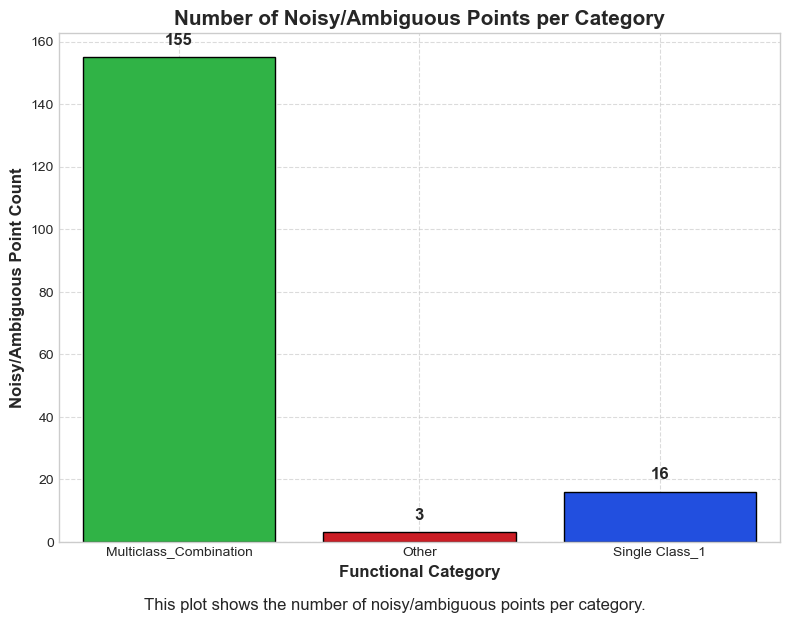

In [23]:
noisy_class_counts = Counter(y_color[noisy_indices])
noisy_bar_labels = [legend_labels.get(i, f"Category {i}") for i in noisy_class_counts.keys()]
noisy_bar_values = [noisy_class_counts[i] for i in noisy_class_counts.keys()]

plt.figure(figsize=(8, 6))
sns.barplot(x=noisy_bar_labels, y=noisy_bar_values, palette=[palette[i] for i in noisy_class_counts.keys()], edgecolor='black')
plt.title('Number of Noisy/Ambiguous Points per Category', fontsize=15, fontweight='bold')
plt.xlabel('Functional Category', fontsize=12, fontweight='bold')
plt.ylabel('Noisy/Ambiguous Point Count', fontsize=12, fontweight='bold')
plt.grid(axis='both', linestyle='--', alpha=0.7)
for i, val in enumerate(noisy_bar_values):
    plt.text(i, val + max(noisy_bar_values)*0.02, str(val), ha='center', va='bottom', fontsize=12, fontweight='bold')
plt.tight_layout()
plt.figtext(
    0.5, -0.05,
    "This plot shows the number of noisy/ambiguous points per category.\n",
    wrap=True, ha="center", fontsize=12
)
plt.show();

**Ambiguous (noisy) points** are defined as those whose t-SNE neighbors mostly have different class labels—often occurring near cluster boundaries or in regions of class overlap.

**The Role of Class Imbalance**
- The "Other" class dominates the dataset and fills most of the embedding space.
- Minority class points (like "Multiclass_Combination" or "Single Class_1") are far more likely to be surrounded by the omnipresent "Other" points. As a result, these minority points fail the neighbor agreement check and are marked as ambiguous.
- In contrast, most "Other" class points are surrounded by similar points from their own class, so only a few near boundaries are flagged as ambiguous.

**Summary**
Class imbalance means the majority (“Other”) class shapes local neighborhoods, so minority class points are routinely labeled ambiguous—even when their true structure is clear. Ambiguity largely reflects category size and spatial dominance, not just clustering quality.

#### Outliers

**Outliers** : *In this section I highlight the outliers in the t-sne embeddings which are isolated points in the embeddings that donot belong to cluster groups*

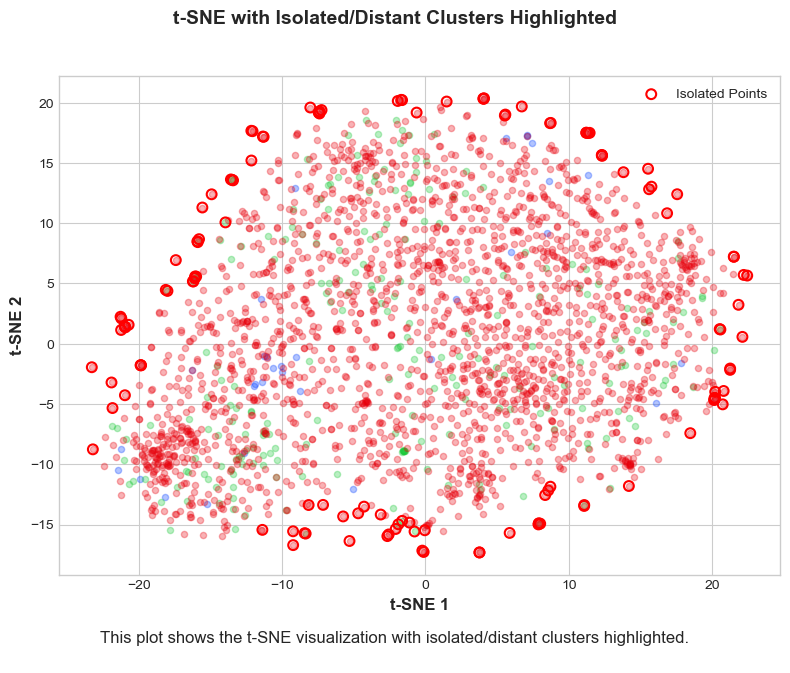

In [24]:
nbrs = NearestNeighbors(n_neighbors=30).fit(X_tsne)
distances, indices = nbrs.kneighbors(X_tsne)

# Threshold distance: points with all neighbors farther than a certain distance are outliers
distance_threshold = np.percentile(distances[:,-1], 95)  # e.g., 95th percentile of max neighbor distances

# Identify isolated points: points whose all neighbors are farther than the threshold
isolated_points = []
for i, neighbor_idxs in enumerate(indices):
    max_dist = distances[i, -1]
    if max_dist > distance_threshold:
        isolated_points.append(i)

# Plotting the clusters with isolated points highlighted
plt.figure(figsize=(8, 6))

# Plot all points
for cat in np.unique(categorical_index):
    idx = categorical_index == cat
    plt.scatter(X_tsne[idx, 0], X_tsne[idx, 1], alpha=0.3, s=20, color=palette[cat])

# Highlight isolated points with a distinct marker
plt.scatter(X_tsne[isolated_points, 0], X_tsne[isolated_points, 1], s=50,
            facecolors='none', edgecolors='red', linewidths=1.5, label='Isolated Points')

plt.suptitle("t-SNE with Isolated/Distant Clusters Highlighted", fontsize=14, fontweight='bold', y =1.03)
plt.xlabel("t-SNE 1", fontsize=12, fontweight='bold')
plt.ylabel("t-SNE 2", fontsize=12, fontweight='bold')
plt.legend()
plt.figtext(
    0.5, -0.05,
    "This plot shows the t-SNE visualization with isolated/distant clusters highlighted.\n",
    wrap=True, ha="center", fontsize=12
)
plt.tight_layout()
plt.show();


/var/folders/pn/xpl3zyks46x_btlk116jn1780000gn/T/ipykernel_15928/2255485242.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=isolated_bar_labels, y=isolated_bar_values, palette=[palette[i] for i in isolated_class_counts.keys()], edgecolor='black')


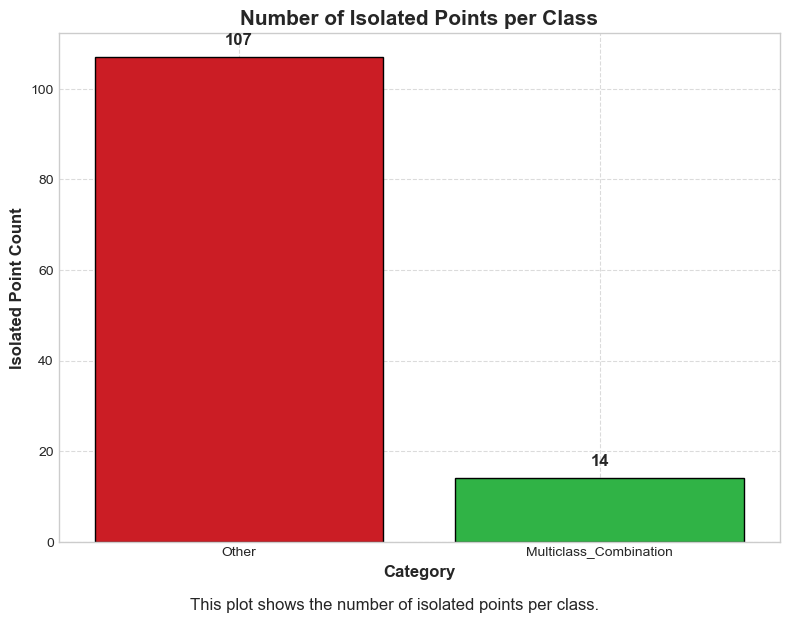

In [25]:
isolated_class_counts = Counter(categorical_index[isolated_points])
isolated_bar_labels = [legend_labels.get(i, f"Category {i}") for i in isolated_class_counts.keys()]
isolated_bar_values = [isolated_class_counts[i] for i in isolated_class_counts.keys()]

plt.figure(figsize=(8, 6))
sns.barplot(x=isolated_bar_labels, y=isolated_bar_values, palette=[palette[i] for i in isolated_class_counts.keys()], edgecolor='black')
plt.title('Number of Isolated Points per Class', fontsize=15, fontweight='bold')
plt.xlabel('Category', fontsize=12, fontweight='bold')
plt.ylabel('Isolated Point Count', fontsize=12, fontweight='bold')
plt.grid(axis='both', linestyle='--', alpha=0.7)
for i, val in enumerate(isolated_bar_values):
    plt.text(i, val + max(isolated_bar_values)*0.02, str(val), ha='center', va='bottom', fontsize=12, fontweight='bold')
plt.tight_layout()
plt.figtext(
    0.5, -0.05,
    "This plot shows the number of isolated points per class.\n",
    wrap=True, ha="center", fontsize=12
)
plt.show();

**Explanation of Isolated Points (Outliers) in t-SNE**

Isolated points are samples that are spatially far from most of their neighbors within the t-SNE embedding, typically located on cluster edges or in sparse regions.

**Why are outliers more frequent in some classes?**

- The dominant "Other" class has the most isolated points because it forms large, dispersed clusters with many peripheral points.
- Smaller classes like "Single Class_1" have fewer isolated points due to tighter and denser clusters, and fewer samples overall.
- The intermediate "Multiclass_Combination" shows moderate isolated points, reflecting its moderate cluster size and spread.

**Interpretation & Hypothesis:**  
Isolated or distant points in the t-SNE map may reflect gene expression profiles that are rare, atypical, or distinct from most of the dataset. These could represent:
  - Unusual gene functions or rare biological variants.
  - True biological outliers with unique cellular roles.
  - Experimental noise, data artifacts, or errors in measurement or labeling.
Such observations may warrant further biological investigation or data verification.


#### Hard-to-Learn Samples

**Hard-to-Learn Samples** : *In this section, I explore the hard-to-learn samples which are regions of points where the functional categories are thoroughly mixed and its hard to differentiate*

Hard-to-learn regions shaded: 64


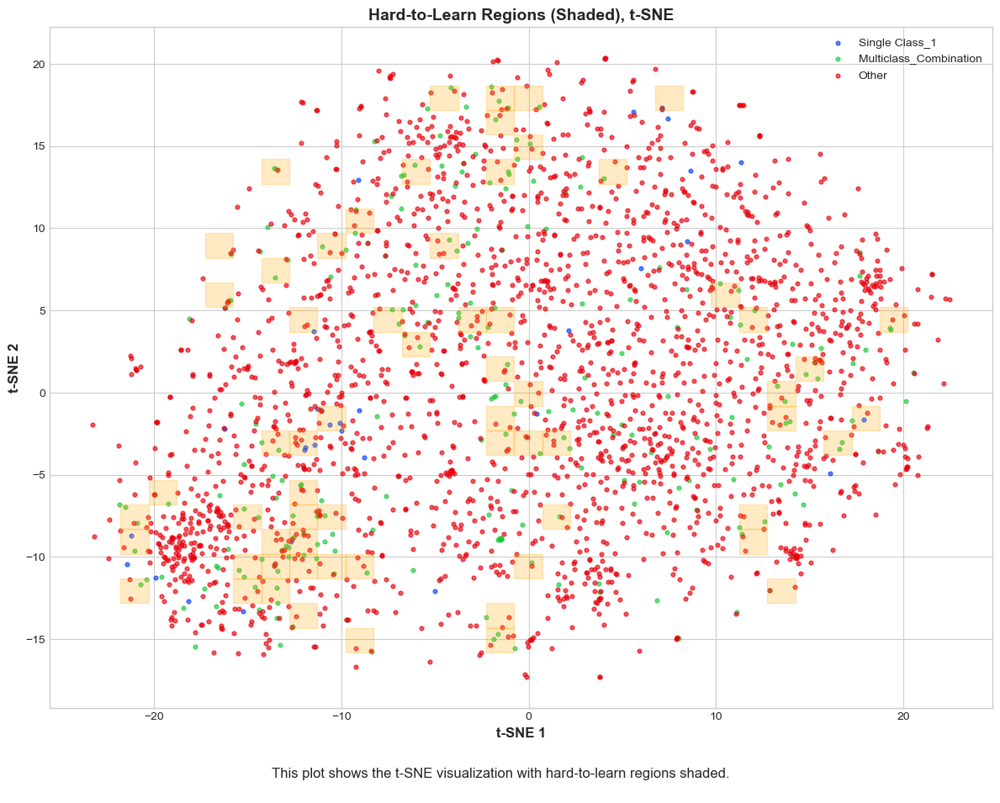

In [26]:
# Spread of t-SNE embedding
X, y = final_tsne_embedding, categorical_index

grid_size = 1.5        # same grid step
min_points = 3     # lower threshold to allow smaller regions
majority_thresh = 0.7  # relax purity criterion, mark regions if max class < 80%

x_min, x_max = final_tsne_embedding[:,0].min(), final_tsne_embedding[:,0].max()
y_min, y_max = final_tsne_embedding[:,1].min(), final_tsne_embedding[:,1].max()
x_bins = np.arange(x_min, x_max, grid_size)
y_bins = np.arange(y_min, y_max, grid_size)

fig, ax = plt.subplots(figsize=(12,9))
for cat, color in zip(np.unique(categorical_index), palette):
    idx = categorical_index == cat
    ax.scatter(final_tsne_embedding[idx, 0], final_tsne_embedding[idx, 1], label=legend_labels.get(cat, f"Category {cat}"), s=12, alpha=0.65, color=palette[cat])

htl_cnt = 0
for i in range(len(x_bins)-1):
    for j in range(len(y_bins)-1):
        xi, xi1, yj, yj1 = x_bins[i], x_bins[i+1], y_bins[j], y_bins[j+1]
        region = ((final_tsne_embedding[:,0]>=xi) & (final_tsne_embedding[:,0]<xi1) & (final_tsne_embedding[:,1]>=yj) & (final_tsne_embedding[:,1]<yj1))
        region_labels = categorical_index[region]
        if len(region_labels) >= min_points:
            frac_majority = np.bincount(region_labels).max() / len(region_labels)
            if frac_majority < majority_thresh:
                rect = plt.Rectangle((xi, yj), grid_size, grid_size, color='orange', alpha=0.23)
                ax.add_patch(rect)
                htl_cnt += 1
print(f"Hard-to-learn regions shaded: {htl_cnt}")

ax.set_xlabel('t-SNE 1', fontsize=12, fontweight='bold')
ax.set_ylabel('t-SNE 2', fontsize=12, fontweight='bold')
ax.set_title('Hard-to-Learn Regions (Shaded), t-SNE', fontsize=14, fontweight='bold')
ax.legend(loc='best')
plt.figtext(
    0.5, -0.05,
    "This plot shows the t-SNE visualization with hard-to-learn regions shaded.\n",
    wrap=True, ha="center", fontsize=12
)
plt.tight_layout()
plt.show();

**Hard-to-Learn Regions in t-SNE Visualization**

This plot overlays orange rectangles on regions of the t-SNE embedding where classes are heavily mixed (no single class exceeds 80% of the cell's points). These are detected by dividing the t-SNE space into grid cells and evaluating local label diversity.

**Why simple classifiers struggle:**
- In these shaded regions, local groups of points belong to several different classes and are not separable by simple linear boundaries.
- A basic classifier (like logistic regression or decision tree) would find it difficult to assign accurate labels, as the feature representation for different classes is highly overlapping and ambiguous.
- These hard-to-learn areas highlight the challenge of multi-label prediction in biological datasets, where functional categories do not form well-separated clusters.

## **Part C: Isomap and Manifold Learning**

### **Part C.1,C.2: Isomap implementation and Visualization**

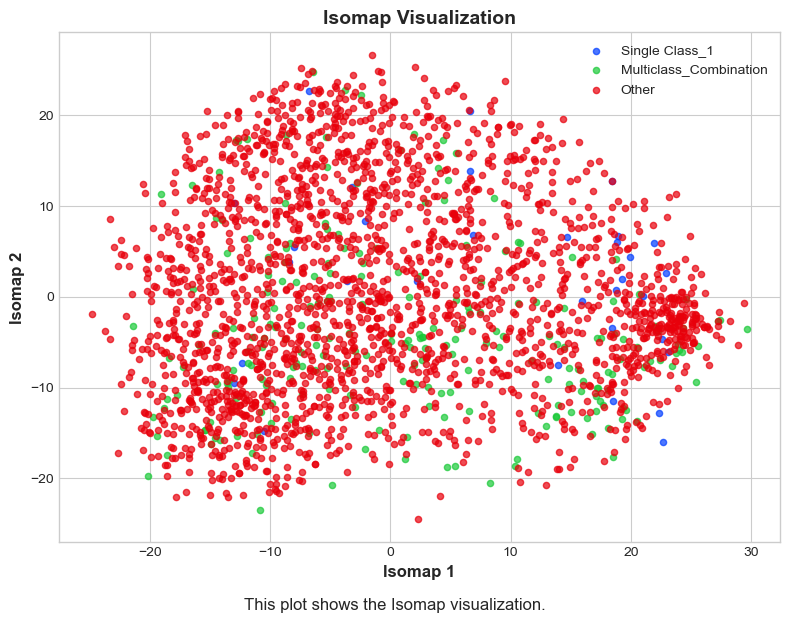

In [27]:
isomap = Isomap(n_components=2, n_neighbors=6)
X_isomap = isomap.fit_transform(X_scaled)
# Visualization
plt.figure(figsize=(8,6))
for cat in np.unique(categorical_index):
    idx = categorical_index == cat
    plt.scatter(X_isomap[idx, 0], X_isomap[idx, 1], label=legend_labels.get(cat, f"Category {cat}"), alpha=0.7, s=20, color=palette[cat])
plt.title("Isomap Visualization", fontsize=14, fontweight='bold')
plt.xlabel("Isomap 1", fontsize=12, fontweight='bold')
plt.ylabel("Isomap 2", fontsize=12, fontweight='bold')
plt.legend()
plt.figtext(
    0.5, -0.05,
    "This plot shows the Isomap visualization.\n",
    wrap=True, ha="center", fontsize=12
)
plt.tight_layout()
plt.show();

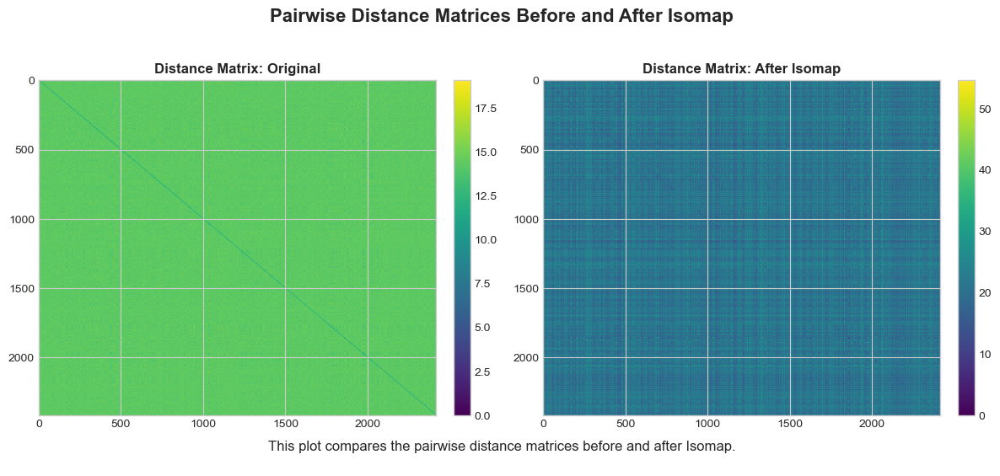

In [28]:
# Calculate the original pairwise distance matrix (e.g., Euclidean)
D_before = pairwise_distances(X_scaled, metric='euclidean')
# Calculate the distance matrix after t-SNE embedding
D_after = pairwise_distances(X_isomap, metric='euclidean')

# Plot both distance matrices side by side
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
im0 = axes[0].imshow(D_before, aspect='auto', cmap='viridis')
axes[0].set_title('Distance Matrix: Original', fontsize=12, fontweight='bold')
plt.colorbar(im0, ax=axes[0], fraction=0.046, pad=0.04)
im1 = axes[1].imshow(D_after, aspect='auto', cmap='viridis')
axes[1].set_title('Distance Matrix: After Isomap', fontsize=12, fontweight='bold')
plt.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04)
plt.suptitle("Pairwise Distance Matrices Before and After Isomap", fontsize=16, fontweight='bold', y=1.03)
plt.figtext(
    0.5, -0.05,
    "This plot compares the pairwise distance matrices before and after Isomap.\n",
    wrap=True, ha="center", fontsize=12
)
plt.tight_layout()
plt.show();

- **Left plot (Original):** Shows the pairwise distances in the original high-dimensional data space. All distances appear relatively uniform.
- **Right plot (After Isomap):** Displays the pairwise distances after Isomap, a nonlinear dimensionality reduction technique. Here, the distances reflect the learned manifold structure, potentially revealing more variation and structure.

This visual comparison demonstrates how Isomap transforms the data to capture its intrinsic geometry, often revealing relationships or patterns that are not visible in the original space.

**Isomap Visualization: Output and Method Comparison**

This plot shows a 2D Isomap embedding of the yeast gene expression data, with each point colored by its simplified functional category. The Isomap algorithm is used here with 10 neighbors to reduce the original feature space to two dimensions for visualization.

- Most samples are colored red ("Other"), with fewer green and blue points representing common classes and multi-label combinations.
- The distribution aims to preserve the global manifold structure of the data.

**Isomap vs. t-SNE:**
- **Isomap** preserves the **global** structure of the data manifold. It does this by constructing a neighborhood graph and approximating geodesic (shortest-path) distances between all pairs of points, then embedding those distances into lower dimensions. This approach retains overall shape, distances, and topology of the dataset.
- **t-SNE** preserves **local** relationships. It focuses on capturing local similarities (neighborhoods), emphasizing nearby points and often distorting global distances or shapes. This makes t-SNE ideal for visualizing clusters and local groupings but less effective for reflecting overall manifold geometry.

In summary: Isomap emphasizes the big-picture, global data structure, while t-SNE emphasizes detail and local clusters.

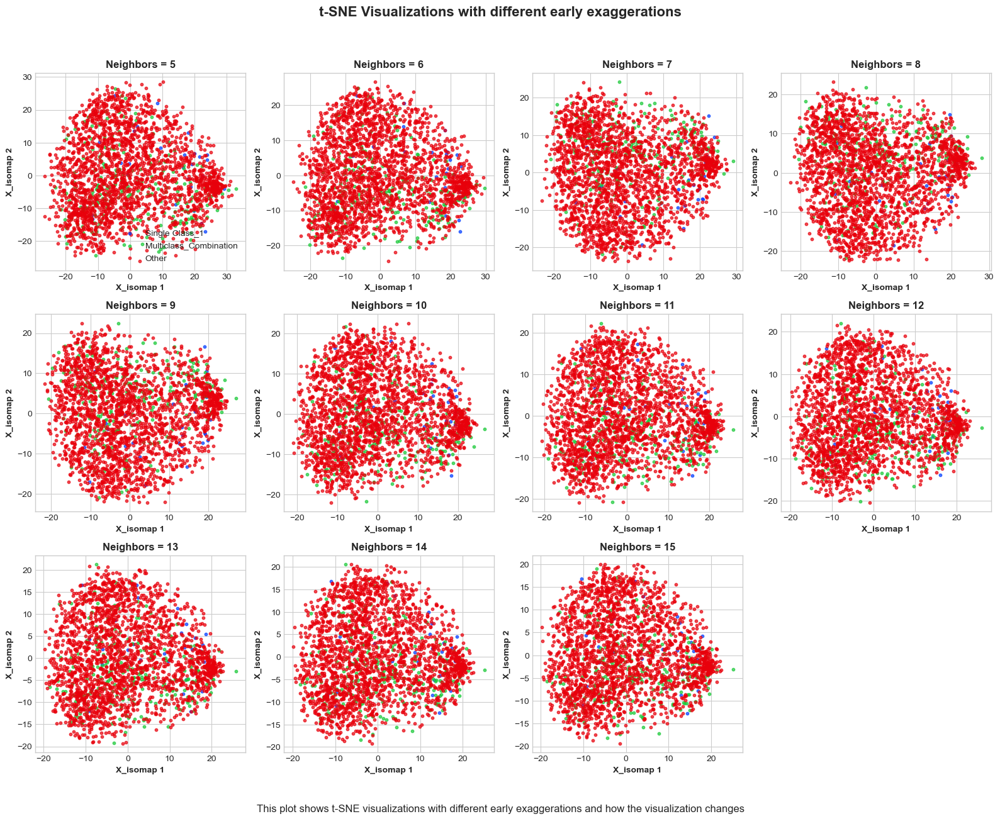

In [29]:
# Define perplexity values
neighbors = [5,6,7,8,9,10,11,12,13,14,15]
# Prepare subplots
n_cols = 4
n_rows = (len(neighbors) + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(4*n_cols, 4*n_rows), squeeze=False)
silhouette_scores = []
for i, neighbor in enumerate(neighbors):
    isomap = Isomap(n_components=2, n_neighbors=neighbor)
    X_isomap = isomap.fit_transform(X_scaled)
    score = silhouette_score(X_isomap, categorical_index)
    silhouette_scores.append(score)
    ax = axes[i // n_cols, i % n_cols]

    for cat in np.unique(categorical_index):
        idx = categorical_index == cat
        ax.scatter(X_isomap[idx, 0], X_isomap[idx, 1], label=legend_labels.get(cat, f"Category {cat}"), alpha=0.7, s=10, color=palette[cat])

    ax.set_title(f"Neighbors = {neighbor}", fontsize=12, fontweight='bold')
    ax.set_xlabel("X_isomap 1", fontsize=10, fontweight='bold')
    ax.set_ylabel("X_isomap 2", fontsize=10, fontweight='bold')

    if i == 0:
        ax.legend()

# Hide unused subplots
for j in range(i + 1, n_rows * n_cols):
    axes[j // n_cols, j % n_cols].axis('off')

plt.suptitle("t-SNE Visualizations with different early exaggerations", fontsize=16, fontweight='bold', y= 1.03)
plt.figtext(
    0.5, -0.05, 
    "This plot shows t-SNE visualizations with different early exaggerations and how the visualization changes\n",
    wrap=True, ha="center", fontsize=12
)
plt.tight_layout()
plt.show();

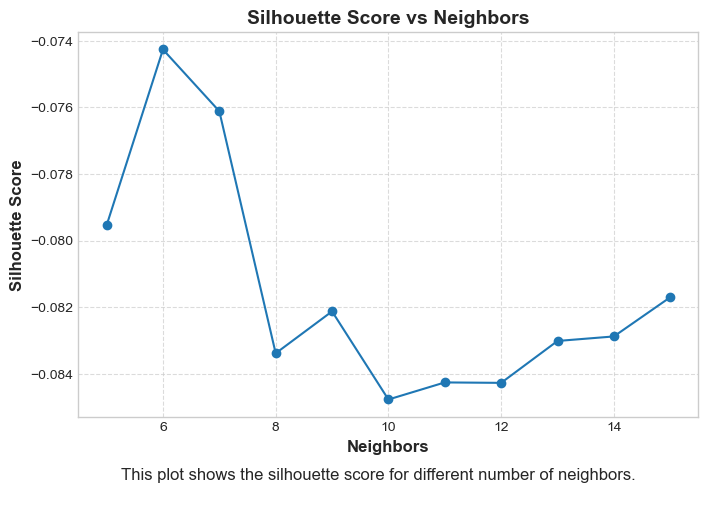

In [30]:
plt.figure(figsize=(8, 5))
plt.plot(neighbors, silhouette_scores, marker='o')
plt.title('Silhouette Score vs Neighbors', fontsize=14, fontweight='bold')
plt.xlabel('Neighbors', fontsize=12, fontweight='bold')
plt.ylabel('Silhouette Score', fontsize=12, fontweight='bold')
plt.grid(axis='both', linestyle='--', alpha=0.7)
plt.figtext(
    0.5, -0.05, 
    "This plot shows the silhouette score for different number of neighbors.\n",
    ha='center', fontsize=12
)
plt.show();

**Number of Neighbors in Isomap**

- Isomap builds a neighborhood graph using each data point's `k` nearest neighbors.
- This parameter governs how local or global the relationships are in preserving the data's manifold structure:
  - **Small values** (e.g., 5–7): Focus on fine local detail, may risk disconnected or fragmented graphs.
  - **Large values** (e.g., 12–15): Connect broader regions, can oversmooth and blur meaningful structure.

**Explanation**

- **Very low neighbors (5–7):** Embeddings can show noisy, possibly fragmented clusters or disconnected shapes.
- **Moderate neighbors (8–10):** Clusters are better formed and visual structure stabilizes; less noisy arrangement.
- **High neighbors (11–15):** Embeddings become increasingly blended, local identities are lost, and clusters may be harder to distinguish.
- The silhoutte score **peaks at neighbors = 6**, indicating this setting best preserves natural grouping while maintaining connectivity.
- Increasing the number beyond this point lowers separation and interpretability, as shown by a declining silhouette score.

**Conclusion**

- Use **neighbors = 6** for Isomap on this dataset.
- This value provides the best trade-off between capturing fine local manifold structure and maintaining global connectivity, as confirmed by both visualization and silhouette clustering metric.

### **Part C.3: Comparison and Curvature**

#### 1. Compare the Isomap visualization to the t-SNE visualization. Which one is better at revealing the global structure of the gene expression data?

The Isomap visualization (left) and the t-SNE visualization (right) both project high-dimensional gene expression data into two dimensions for inspection. 

**Isomap** aims to preserve the global geometry of the dataset by maintaining geodesic (manifold) distances between all points, resulting in an embedding that reflects the overall topological relationships and relative positions of clusters in the full data space.

**t-SNE**, on the other hand, faithfully represents local neighborhoods and cluster boundaries, focusing on separating similar points locally but often distorting the larger-scale arrangement of clusters and ignoring global distance relationships.

**Conclusion:**  
Isomap is better at revealing the global structure of the gene expression data, presenting a holistic view of how different categories relate at the manifold level. t-SNE excels in visualizing local clusters and identifying fine-grained grouping, but its global layout may misrepresent inter-cluster distances and overall shape.

#### 2. Discuss the concept of the data manifold. Does the Isomap plot suggest a highly curved or complex manifold? How does the complexity of this manifold relate to the difficulty of classification? 

In high-dimensional data such as gene expression profiles, samples often lie on a **data manifold**—a lower-dimensional, curved surface embedded within the larger feature space that captures the intrinsic structure of the data.

The Isomap embedding reveals that this manifold is **highly curved and complex**, as indicated by the irregular, folded shape of the projected points. This complexity reflects the nonlinear relationships between samples caused by biological variability and functional diversity.

Because the manifold is complex and non-Euclidean, class boundaries within this space are nonlinear and intertwined. This poses a significant challenge for classifiers, especially simple linear models, which struggle to separate classes that overlap or twist around each other on the manifold.

Consequently, the curved and complex manifold structure contributes directly to the difficulty of accurately classifying gene functions. Advanced methods that respect manifold geometry or capture nonlinear decision boundaries are often required to achieve better predictive performance on such data.